In [ ]:
!pip install descartes

In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import rasterio as rio

from rasterio import features
from pathlib import Path
import pathlib
import geopandas as gpd
from descartes import PolygonPatch
from PIL import Image
import itertools
import re

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils


# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%matplotlib inline 

In [3]:
mpl.rcParams['figure.dpi'] = 300 #increase plot resolution
mpl.rcParams['figure.dpi']

300.0

## Input Paths

In [4]:
train_dir = Path('../archive/SN7_buildings_train')
test_dir = Path('../archive/SN7_buildings_test_public')
sample_dir = Path('../archive/SN7_buildings_train_sample')
train_dir

PosixPath('../archive/SN7_buildings_train')

## Output Paths

In [5]:
output_path = Path.cwd()
output_csv_path = output_path/'output_csvs/'
Path(output_csv_path).mkdir(parents=True, exist_ok=True)

## Test Path and GeoDataFrame

In [6]:
test_raster_path = Path('../archive/SN7_buildings_train/train/L15-0331E-1257N_1327_3160_13/images_masked/global_monthly_2018_01_mosaic_L15-0331E-1257N_1327_3160_13.tif')
test_raster_path_24 = Path('../archive/SN7_buildings_train/train/L15-0331E-1257N_1327_3160_13/images_masked/global_monthly_2020_01_mosaic_L15-0331E-1257N_1327_3160_13.tif')
test_geojson_path = Path('../archive/SN7_buildings_train/train/L15-0331E-1257N_1327_3160_13/labels_match_pix/global_monthly_2018_01_mosaic_L15-0331E-1257N_1327_3160_13_Buildings.geojson')
test_geojson_path_24 = Path('../archive/SN7_buildings_train/train/L15-0331E-1257N_1327_3160_13/labels_match_pix/global_monthly_2020_01_mosaic_L15-0331E-1257N_1327_3160_13_Buildings.geojson')
test_gdf = gpd.read_file(test_geojson_path)
test_gdf_24 = gpd.read_file(test_geojson_path_24)

In [7]:
test_gdf.set_index('Id',inplace=True)
test_gdf_24.set_index('Id',inplace=True)

test_gdf.sort_index(inplace=True)
test_gdf_24.sort_index(inplace=True)


In [8]:
test_gdf

,area,image_fname,geometry
Id,,,
0,4415.331411,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((999.40213 982.19078, 999.40213 1000...."
1,3696.243952,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((322.53679 236.86576, 305.92177 236.8..."
2,2812.190604,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((459.45307 610.95518, 446.32720 610.9..."
3,2465.282709,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((326.82184 843.94904, 319.95430 843.9..."
4,2409.909054,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((485.88618 716.23900, 478.40942 716.2..."
...,...,...,...
1935,73.714865,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((666.62437 168.86803, 668.11973 168.8..."
1936,73.131966,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((482.17902 241.60199, 480.49994 241.6..."
1937,68.834297,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((122.84467 456.88685, 120.33865 456.8..."


Let's write couple of helper functions to help us visualize our raster files and vector files.

## Plotting GeoDataFrame Polygons

In [9]:
def plot_gdf(gdf,fill=False,ax=None,linewidth=0.2):
    if ax is None:
        _,ax = plt.subplots(1,figsize=(3, 3))
        
    for geom in gdf['geometry']:
        if fill:
            patch = PolygonPatch(geom,linewidth=linewidth,color='fuchsia')
            ax.add_patch(patch)
        else:
            ax.plot(*geom.exterior.xy,linewidth=linewidth)
    return(ax)

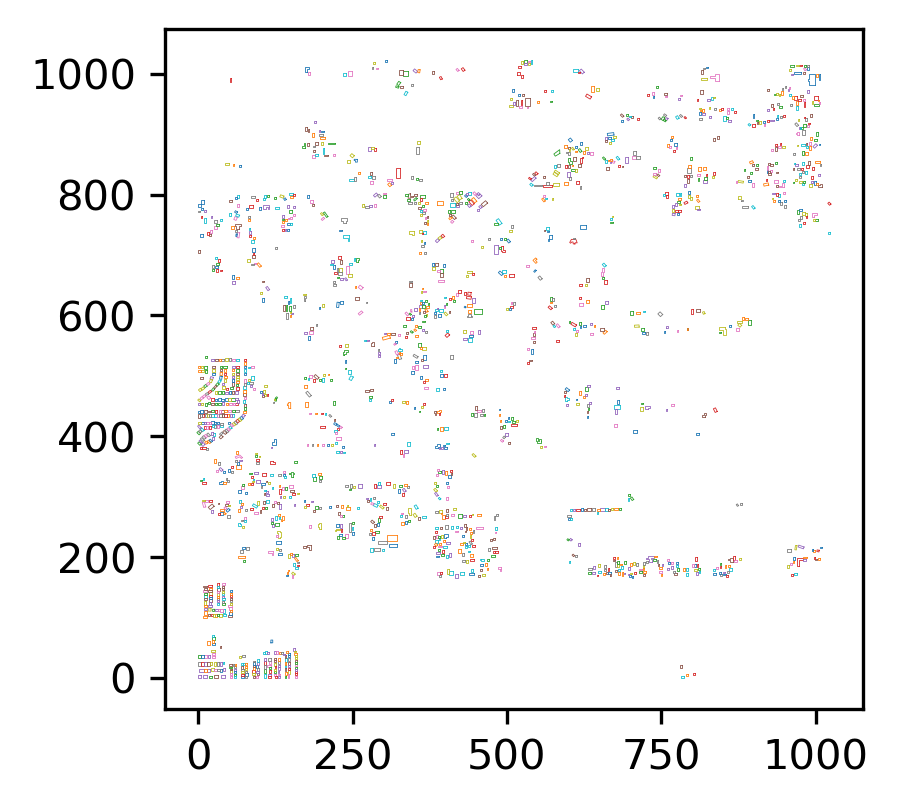

In [10]:
plot_gdf(test_gdf);

## Plotting Satellite Image
The function below takes in a satellite tif image and plots it. It also has the option to use the previous function that we created to overlay the polygons on top of the image.

In [10]:
def plot_sat(path,gdf=None, fill=False,linewidth=0.2):
    f, ax = plt.subplots(1,figsize=(3, 3))
    f.tight_layout()
    
    r = rio.open(path)
    r = r.read()
    r = r.transpose((1,2,0,))
    ax.imshow(r)
    
    print(f'Image shape: {r.shape}')
    
    if gdf is not None:
        plot_gdf(gdf,fill=fill,ax=ax,linewidth=linewidth)
        
    return(ax)

Image shape: (1023, 1024, 4)


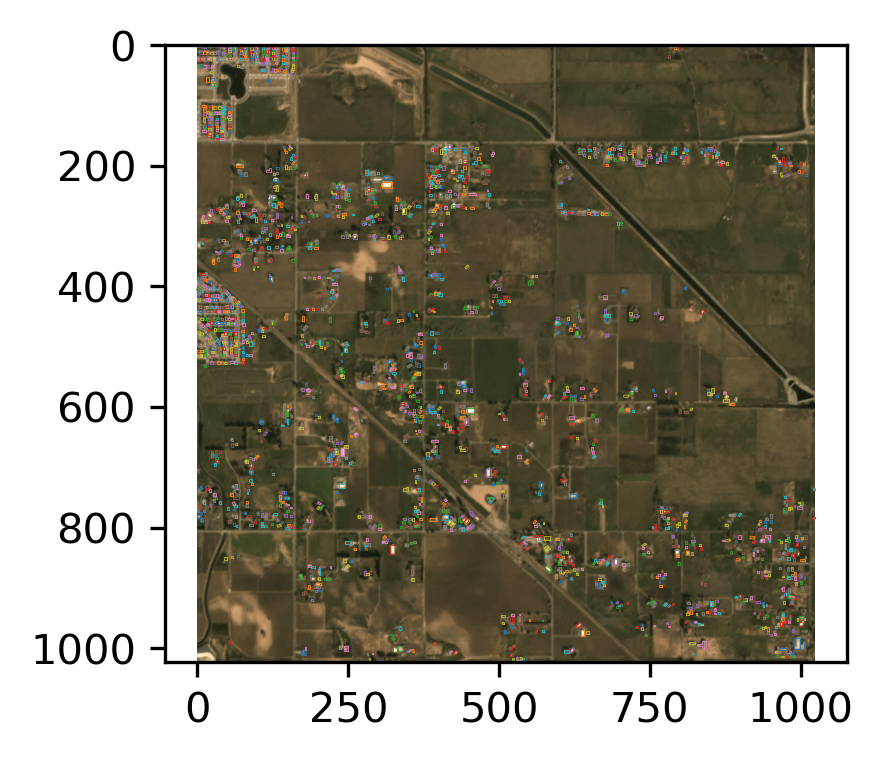

In [11]:
plot_sat(path=test_raster_path,gdf=test_gdf);

Image shape: (1023, 1024, 4)
Image shape: (1023, 1024, 4)


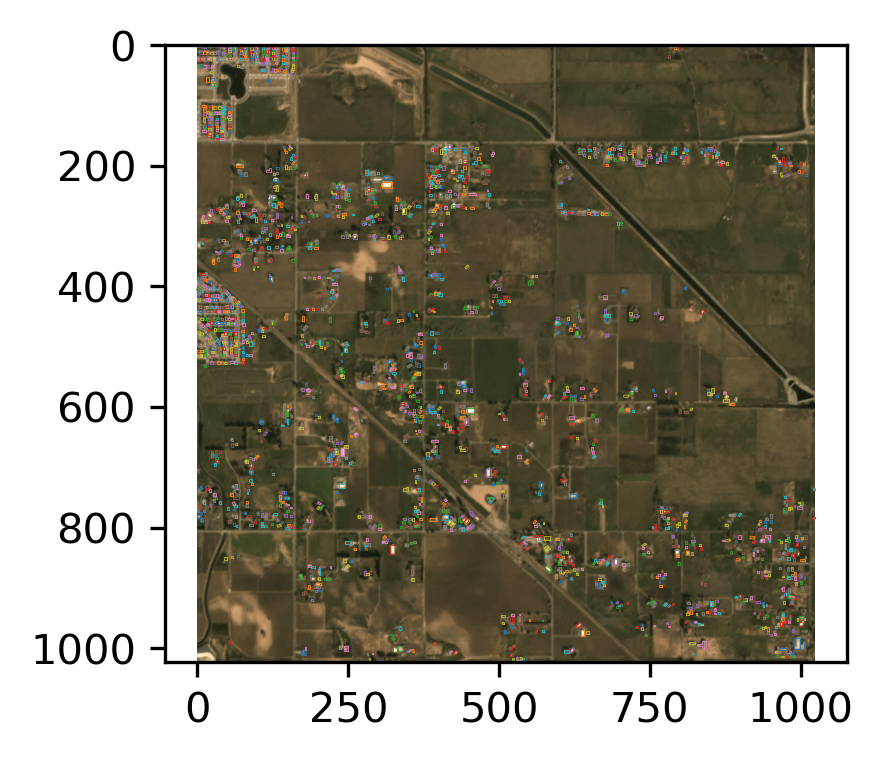

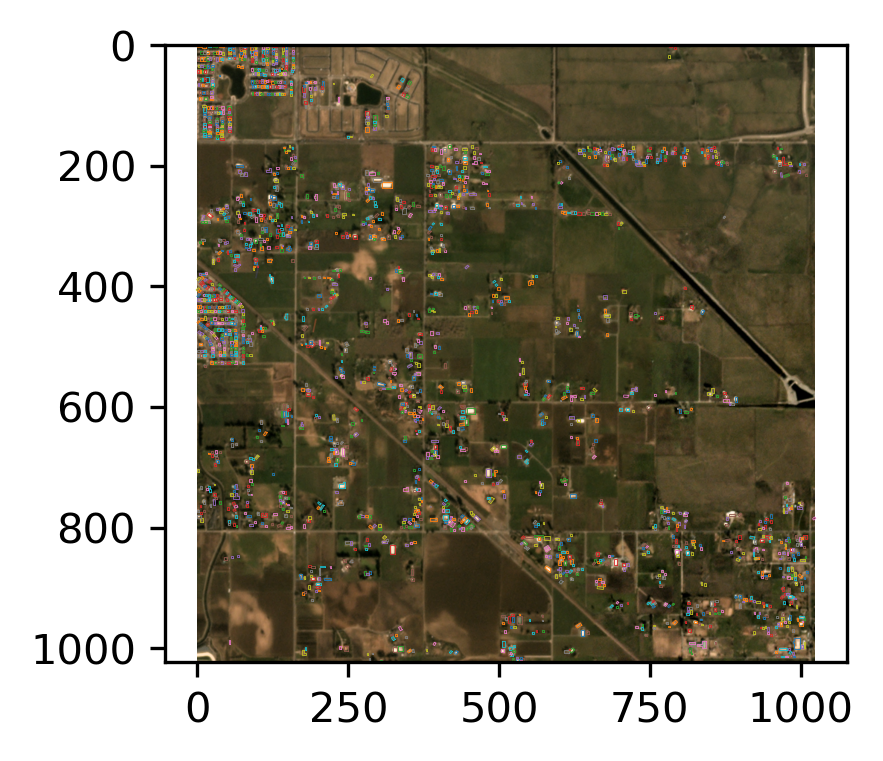

In [12]:
plot_sat(path=test_raster_path,gdf=test_gdf);
plot_sat(path=test_raster_path_24,gdf=test_gdf_24);

## Rasterizing Polygons

Below we create a short helper function that rasterizes our geodataframe

In [13]:
def rasterize_geojson(geojson_path,reference_raster_path):
    gdf = gpd.read_file(geojson_path)
    with rio.open(reference_raster_path) as raster:
        r = raster.read(1)
        
        mask = image = features.rasterize(((polygon, 255) for polygon in gdf['geometry']),out_shape=r.shape)
        
    return mask

In [14]:
def rasterize_gdf(gdf,reference_raster_path):
    
    with rio.open(reference_raster_path) as raster:
        r = raster.read(1)
        
        mask = image = features.rasterize(((polygon, 255) for polygon in gdf['geometry']),out_shape=r.shape)
        
    return mask

In [91]:
test_mask = rasterize_geojson(test_geojson_path,test_raster_path)
test_mask_24 = rasterize_geojson(test_geojson_path_24,test_raster_path_24)

We should now have a numpy array containing only values of 0 and 255. The values equal to 255 represent our target buildling footprint.

In [16]:
np.unique(test_mask)

array([  0, 255], dtype=uint8)

In [17]:
test_mask.shape, type(test_mask_24)

((1023, 1024), numpy.ndarray)

Let's visualize our output masks for month 1 and month 24 from our sample images.

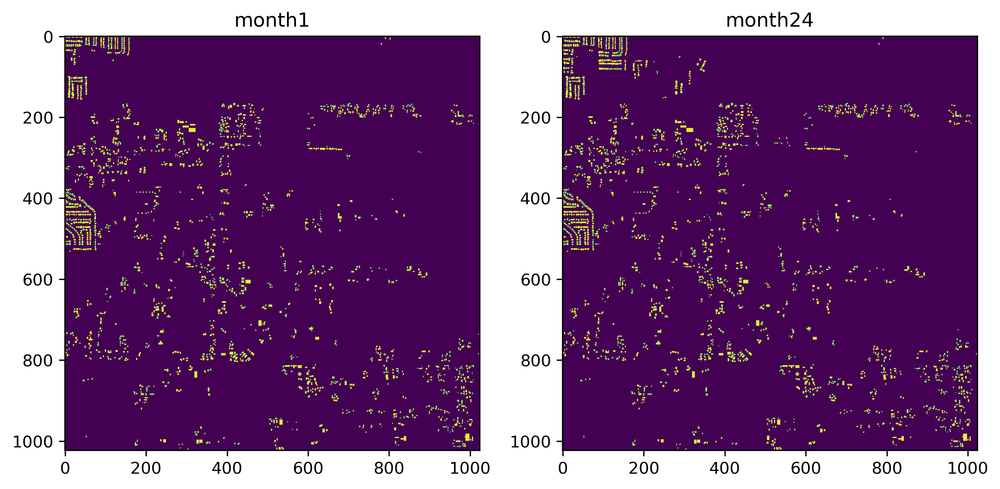

In [19]:
mpl.rcParams['figure.dpi'] = 300
_,axs = plt.subplots(1,2,figsize=(10,10))

masks = [test_mask,test_mask_24]
titles = ['month1','month24']

for i,ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.imshow(masks[i]);

array([[False, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

## Getting the Differences between 2 Geodataframes
Next we are going to create some helper functions to extract the difference from our image polygons. This function will be given 2 geodataframes and it will return a geodataframe containing the differences between the 2 images.

For more information on getting the geojson difference, check out the following [notebook](https://www.kaggle.com/amerii/augmenting-spacenet-7-sample-data-labels).

In [20]:
def gdf_difference(gdf1, gdf2, get_dates=False):
    try:
        gdf1.reset_index(inplace=True,drop=True)
    except:
        pass
    try:
        gdf2.reset_index(inplace=True,drop=True)
    except:
        pass
    
    
    len_1 = len(gdf1)
    len_2 = len(gdf2)
    
    len_diff = abs(len_2-len_1)
    
    if len_2 > len_1:
        start_index = len_2-len_diff
        diff_gdf = gdf2[start_index:].copy()
    else:
        start_index = len_1-len_diff
        diff_gdf = gdf1[start_index:].copy()

    diff_gdf.reset_index(inplace=True,drop=True)
        
    return diff_gdf

In [73]:
test_gdf


,area,image_fname,geometry
0,4415.331411,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((999.40213 982.19078, 999.40213 1000...."
1,3696.243952,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((322.53679 236.86576, 305.92177 236.8..."
2,2812.190604,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((459.45307 610.95518, 446.32720 610.9..."
3,2465.282709,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((326.82184 843.94904, 319.95430 843.9..."
4,2409.909054,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((485.88618 716.23900, 478.40942 716.2..."
...,...,...,...
1935,73.714865,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((666.62437 168.86803, 668.11973 168.8..."
1936,73.131966,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((482.17902 241.60199, 480.49994 241.6..."
1937,68.834297,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((122.84467 456.88685, 120.33865 456.8..."
1938,57.174174,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,"POLYGON ((123.96072 461.87520, 123.05243 461.8..."


Let's see what kind of output we get, by getting the difference between our 2 previous geodataframes.

In [21]:
len(test_gdf)

1940

In [74]:
len(test_gdf_24)

2108

In [22]:
diff_gdf = gdf_difference(test_gdf,test_gdf_24)
diff_gdf

,area,iou_score,image_fname,geometry
0,364.584062,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((118.58085 78.61858, 122.01462 78.618..."
1,351.143175,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((110.15976 66.09307, 113.81506 66.093..."
2,327.621623,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((105.62113 78.61858, 108.94414 78.618..."
3,321.181198,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((118.35650 66.31460, 121.79027 66.314..."
4,314.180736,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((126.55324 78.94201, 130.20854 78.942..."
...,...,...,...,...
163,105.846986,1.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((384.80234 764.14462, 386.79614 764.1..."
164,378.199297,0.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((985.36244 834.06791, 988.84877 834.0..."
165,272.177964,0.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((857.51065 989.44241, 860.50136 989.4..."
166,158.770479,0.0,global_monthly_2020_01_mosaic_L15-0331E-1257N_...,"POLYGON ((976.14187 723.93444, 978.46798 723.9..."


In [53]:
test_mask_diff = rasterize_gdf(diff_gdf,test_raster_path)
test_mask_diff.shape


(1023, 1024)

In [96]:
difference_mask = np.abs(test_mask_24 - test_mask).astype(np.uint8) 
difference_mask2 = np.logical_xor(test_mask_24, test_mask).astype(np.uint8)
difference_mask2.shape
np.unique(difference_mask2)

array([0, 1], dtype=uint8)

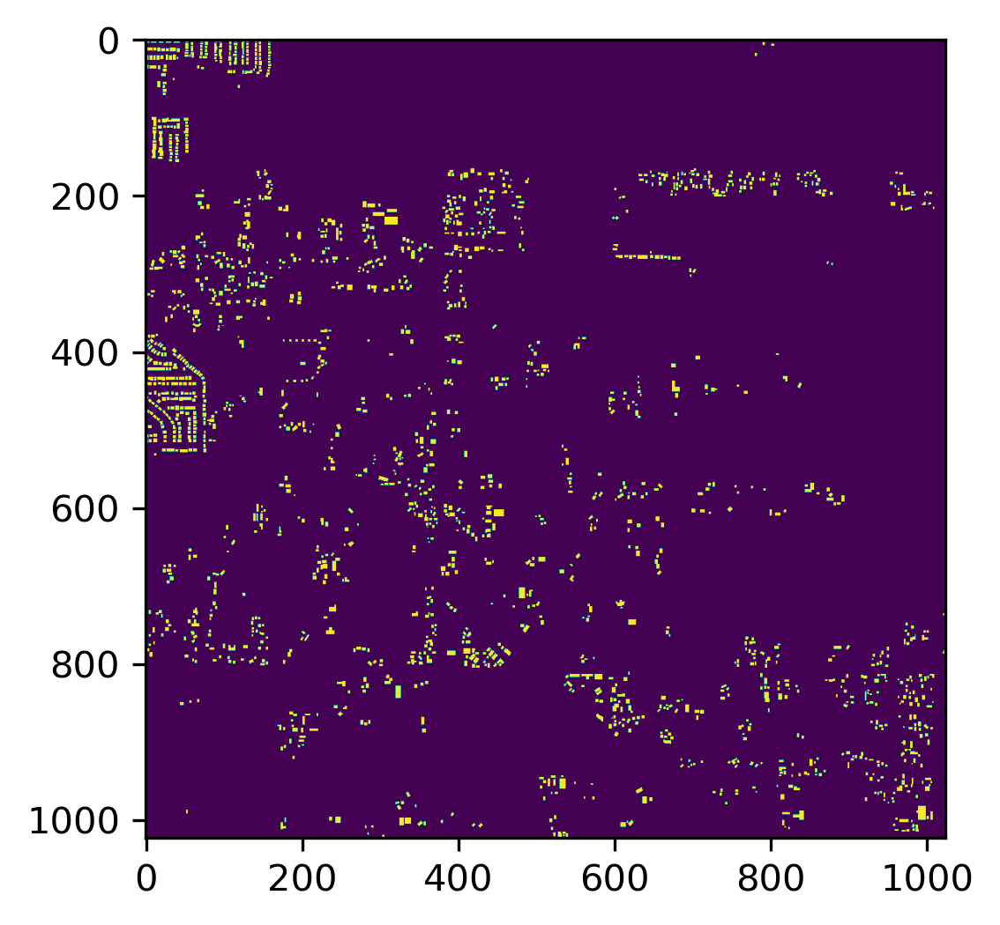

In [83]:
plt.imshow(test_mask)

In [92]:
test_mask = (test_mask == 255).astype(np.uint8)
np.unique(test_mask)

array([0, 1], dtype=uint8)

In [93]:
test_mask_24 = (test_mask_24 == 255).astype(np.uint8)
np.unique(test_mask_24)

array([0, 1], dtype=uint8)

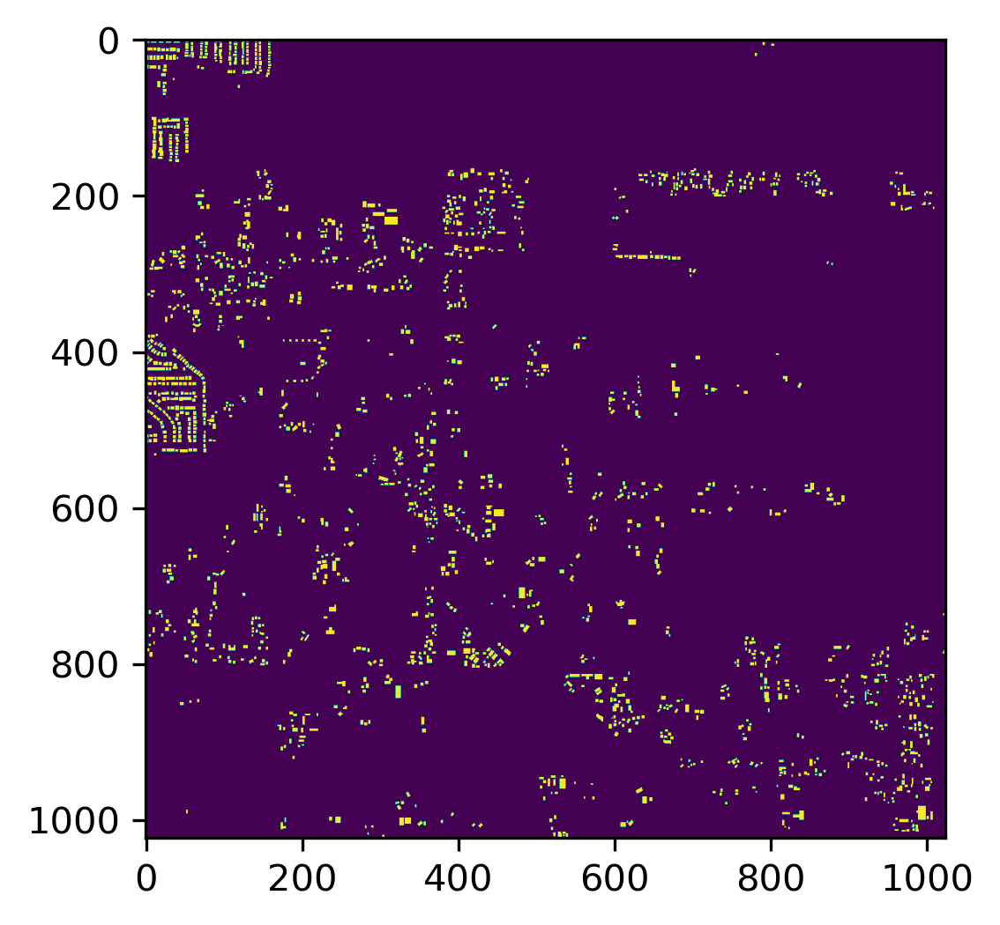

In [85]:
plt.imshow(test_mask)

In [ ]:
test_mask_24 = np.an

In [115]:
np.unique(difference_mask)

array([  0,   1, 255], dtype=uint8)

In [114]:
difference_mask = np.abs(test_mask_24 - test_mask)

In [ ]:
difference_mask = not ()

In [61]:
intersection = np.sum(test_mask_diff * difference_mask)
union = np.sum(test_mask_diff) + np.sum(difference_mask)
dice_coefficient = (2.0 * intersection) / (union + intersection)
dice_coefficient

0.0035247012281993525

In [116]:
difference_count = np.sum(test_mask_diff)
difference_count


619395

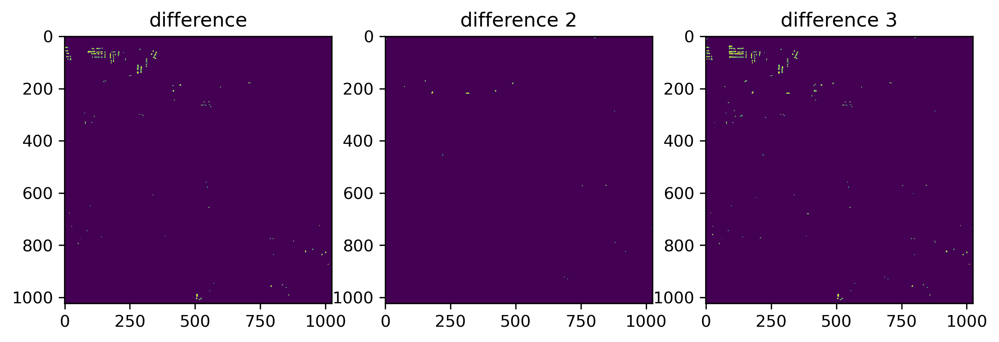

In [111]:
mpl.rcParams['figure.dpi'] = 300
_,axs = plt.subplots(1,3,figsize=(10,10))

masks = [test_mask_diff,difference_mask,difference_mask2]
titles = ['difference', 'difference 2', 'difference 3']

for i,ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.imshow(masks[i]);

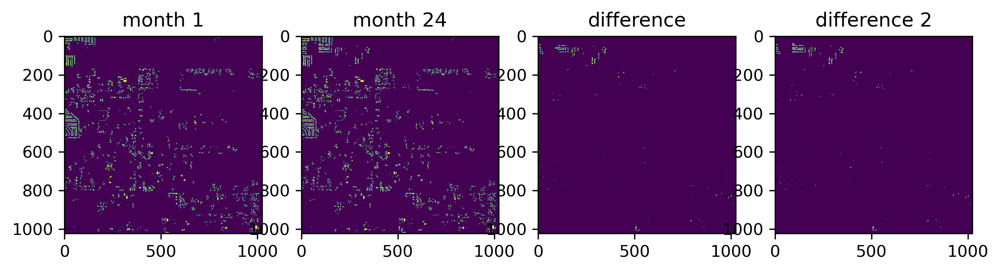

In [42]:
mpl.rcParams['figure.dpi'] = 300
_,axs = plt.subplots(1,4,figsize=(10,10))

masks = [test_mask,test_mask_24,test_mask_diff,difference_mask]
titles = ['month 1', 'month 24', 'difference', 'difference 2']

for i,ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.imshow(masks[i]);

## Creating Chips from our Satellite Imagery
Now that we can extract the difference between 2 satellite images, the next step is to split the satellite image to smaller chips. Another thing to note is that some areas have little to know change in them; that is something we need to consider when training our model. 

One thing we can do, is exclude regions with no change at all, however we will have to experiment whether that will actually improve our results or not.

In [34]:
class chip_creator():   
    def __init__(self, chip_dimension=256,raster=False):  
        self.chip_dimension = chip_dimension
        self.raster = raster
        
    def create_chips(self,image):
        np_array = self.__read_image(image)
        # get number of chips per colomn
        n_rows = (np_array.shape[0] - 1) // self.chip_dimension + 1
        # get number of chips per row
        n_cols = (np_array.shape[1] - 1) // self.chip_dimension + 1
        # segment image into chips and return list of chips
        l = []

        for r in range(n_rows):
            for c in range(n_cols):
                start_r_idx = r*self.chip_dimension
                end_r_idx = start_r_idx + self.chip_dimension

                start_c_idx = c*self.chip_dimension
                end_c_idx = start_c_idx + self.chip_dimension
                chip = np_array[start_r_idx:end_r_idx,start_c_idx:end_c_idx]
                if self.raster:
                   chip = np.moveaxis(chip,-1,0)

                l.append(chip)

        return np.array(l)
    
    def __read_image(self,image):
        # check whether image is a path or array
        if isinstance(image,(pathlib.PurePath,str)):
                with Image.open(image) as img:
                    # convert image into np array
                    np_array = np.array(img)
                return np_array
            
        elif isinstance(image,np.ndarray):
            return image
        else:
            raise ValueError(f"Expected Path or Numpy array received: {type(image)}")

In [35]:
chips_256 = chip_creator(raster=True)

Return raster formatted image (channels, rows, columns)

In [36]:
chips_256.create_chips(test_raster_path)[0].shape

(4, 256, 256)

Return normally formatted image (rows, columns,channels)

In [37]:
chips_256.raster=False

In [43]:
chips_256.create_chips(test_raster_path)[0].shape

(256, 256, 4)

Let's create a helper function to help us plot many images. The raster flag is an option we give to the plotting function in case we are feeding it a list of rasters, in which case we will need to swap the axis of the image channels/bands.

In [39]:
def multiplot_images(list_of_images,ncols=4,dpi=300, raster=False):
    mpl.rcParams['figure.dpi'] = dpi
    nrows = (len(list_of_images) - 1) // ncols + 1
    fig,axs = plt.subplots(nrows,ncols,figsize=(10,10))
    
    fig.tight_layout()
    
    for r,ax in enumerate(axs):
        for c,row in enumerate(ax):
            # get the current index of the image
            i = r*ncols + c
            ax[c].set_title(i)
            image = list_of_images[i]
            # if the image is presented in raster format then move the channel axis
            if raster:
                image = np.moveaxis(image,0,-1)
            ax[c].imshow(image);


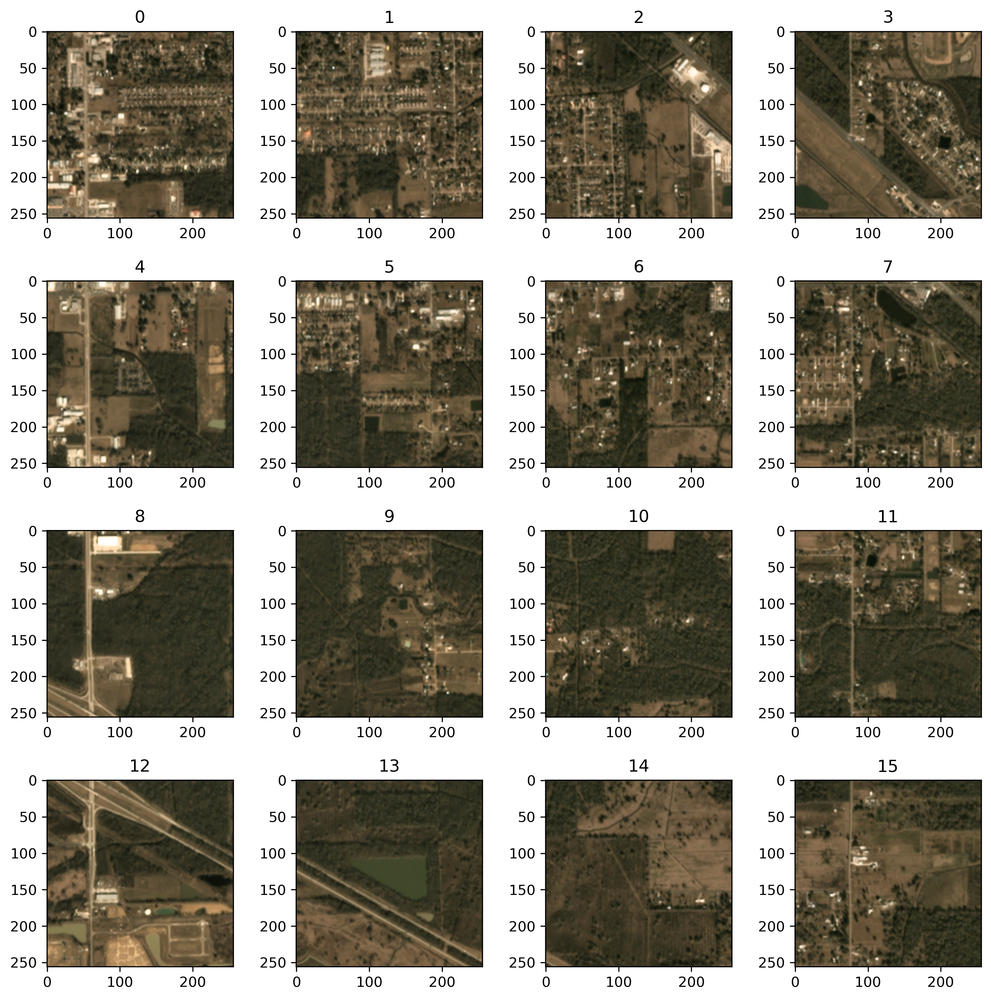

In [40]:
multiplot_images(chips_256.create_chips(test_raster_path));

Let's visualize the image chips for the difference mask that we obtained earlier.

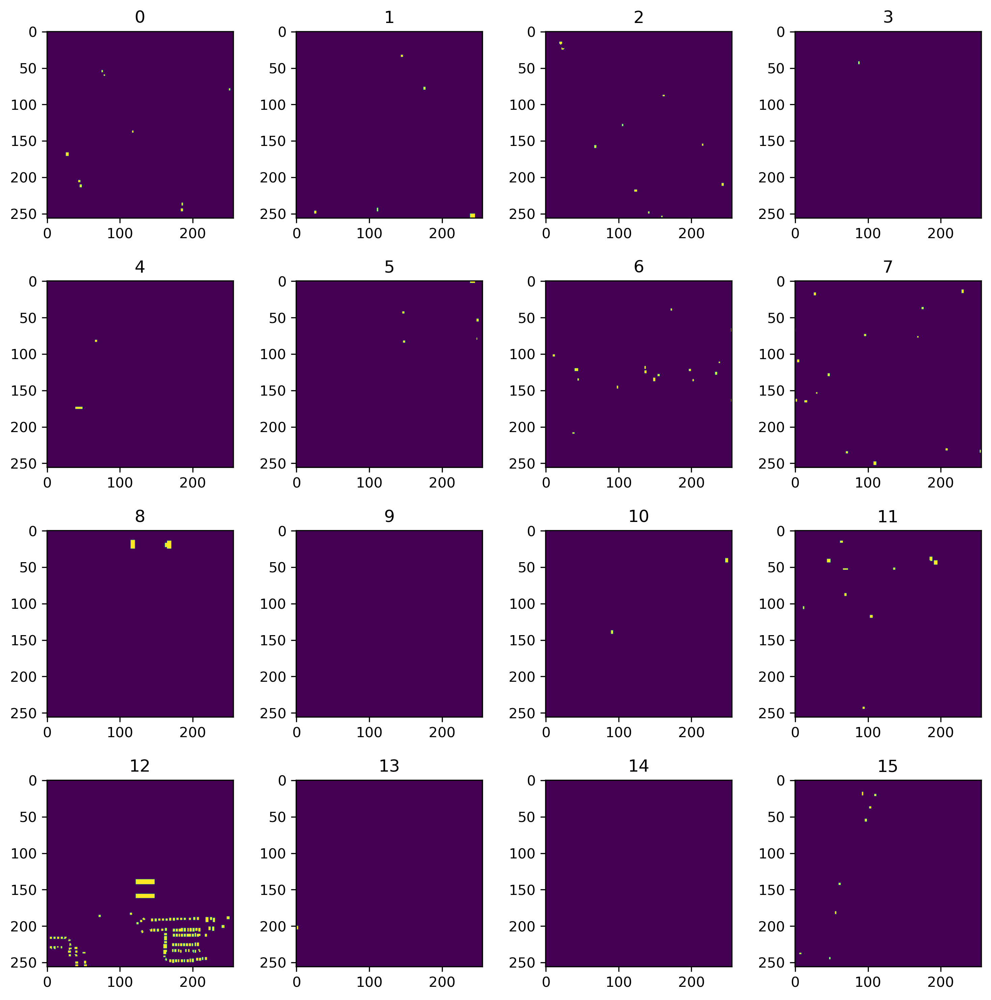

In [41]:
multiplot_images(chips_256.create_chips(test_mask_diff));

# What Next???
Great we now have some amazing helper functions that will make our lives much easier. Let's see how we utilize those helper functions to create our dataset class in our [next notebook](https://www.kaggle.com/amerii/spacenet-7-pytorch-dataset-class-starter)!